<a href="https://colab.research.google.com/github/rHarris4080/Capstone3-Unsupervised-Learning-Project/blob/main/Capstone_3_vFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Capstone 3 - Unsupervised Learning: US Gun Violence Investigation**
##Robert Harris - 5/18/21
The US has a Worldwide reputation as a country of uncontrolled gun violence. The US is a unique country in that its citizens have the right to own and bear arms as written in the 2nd Amendment. I found a few datasets of interest covering gun violence in one form or another.  While I liked one focused on police shootings I decided to pursue a more generalized one on raw gun violence from 2013-2018 on Kaggle.com.

##**Task:**
Write an unsupervised learning model to help identify some patterns associated with gun violence in the United States.  Our dataset is comprosed of 239,677 reported gun related incidents from 2013 to 2018 and can be found at https://www.kaggle.com/jameslko/gun-violence-data. We will only work with incidents occuring during the first quarter of 2018 ( n=13,802 & 38 features) for a more managable datafile.

##**Approach:** 
The dataset has a vast amount amount of information where extensive preliminary cleaning and exploratory data analysis will dominate the early process.  Multiple clustering models and dimensionality techniques will be implemented once the dataset is cleaned and feature engineering is completed on all the categories of interest. 

##**Stakeholders:**
Anyone interested in gaining any insight into gun violence in the US.  While many relationships would make common sense on the surface (ie drugs, gangs, robbery, etc...), any further insights gained could always be beneficial going forward.

##**Limitations:**
1. Dataset: Very little is known about the suspect as far as mental health and motive is concerned.  Some key words like robbery, gang vs gang, and drugs give us some indicating factors but these descriptors were only occasionally present. Also, my knowledge of Natural Language Processing(NLP) is basically non-existent at this point.  My implementation of parsing key word descriptors was therefore archaic at best.
2. Work-Arounds: My self taught working knowledge of lambda functions is a work in progress.  While I have improved in their implementation, I still find myself reverting to more primititive work-arounds when pressed for time. 
3. Dealing with locations(ie state and city) didn't work in an unsupervised environment because of computer processing limitations.  Therefore, I eliminated them and just looked at all the 2018 gun violence incidents as a whole.
4. Code: I would also like to thank all of those who post their code on-line as it is an invaulable resource when tweaking and adjusting things to work as needed.  

##**Further Investigation:**
I would find it interesting to investigate the makeup of the suspects including but not limited to mental health, criminal history, educational level, employment history, and other pertinent personal information.  This could also be segued into a supervised learning model with a predictive component.  As stated earlier, further analysis could be pursued once a foundation in NLP is established.

In [ ]:
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from scipy import stats

#Set up access the dataset
from google.colab import files 
import io

In [ ]:
uploaded = files.upload()
gun_df = pd.read_csv(io.BytesIO(uploaded['gun-violence-data_01-2013_03-2018.csv']))

Saving gun-violence-data_01-2013_03-2018.csv to gun-violence-data_01-2013_03-2018.csv


#**I. Preliminary Data Analysis:**

In [ ]:
df = gun_df.copy()
df.shape

(239677, 29)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239677 entries, 0 to 239676
Data columns (total 29 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   incident_id                  239677 non-null  int64  
 1   date                         239677 non-null  object 
 2   state                        239677 non-null  object 
 3   city_or_county               239677 non-null  object 
 4   address                      223180 non-null  object 
 5   n_killed                     239677 non-null  int64  
 6   n_injured                    239677 non-null  int64  
 7   incident_url                 239677 non-null  object 
 8   source_url                   239209 non-null  object 
 9   incident_url_fields_missing  239677 non-null  bool   
 10  congressional_district       227733 non-null  float64
 11  gun_stolen                   140179 non-null  object 
 12  gun_type                     140226 non-null  object 
 13 

In [ ]:
# First recorded incident
df.iloc[0]

incident_id                                                               461105
date                                                                  2013-01-01
state                                                               Pennsylvania
city_or_county                                                        Mckeesport
address                                1506 Versailles Avenue and Coursin Street
n_killed                                                                       0
n_injured                                                                      4
incident_url                   http://www.gunviolencearchive.org/incident/461105
source_url                     http://www.post-gazette.com/local/south/2013/0...
incident_url_fields_missing                                                False
congressional_district                                                        14
gun_stolen                                                                   NaN
gun_type                    

In [ ]:
df.head(3)

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,incident_url_fields_missing,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,location_description,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_gender,participant_name,participant_relationship,participant_status,participant_type,sources,state_house_district,state_senate_district
0,461105,2013-01-01,Pennsylvania,Mckeesport,1506 Versailles Avenue and Coursin Street,0,4,http://www.gunviolencearchive.org/incident/461105,http://www.post-gazette.com/local/south/2013/0...,False,14.0,NaN,NaN,Shot - Wounded/Injured||Mass Shooting (4+ vict...,40.3467,NaN,-79.8559,NaN,Julian Sims under investigation: Four Shot and...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,0::Julian Sims,NaN,0::Arrested||1::Injured||2::Injured||3::Injure...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://pittsburgh.cbslocal.com/2013/01/01/4-pe...,NaN,NaN
1,460726,2013-01-01,California,Hawthorne,13500 block of Cerise Avenue,1,3,http://www.gunviolencearchive.org/incident/460726,http://www.dailybulletin.com/article/zz/201301...,False,43.0,NaN,NaN,"Shot - Wounded/Injured||Shot - Dead (murder, a...",33.9090,NaN,-118.3330,NaN,Four Shot; One Killed; Unidentified shooter in...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,0::Bernard Gillis,NaN,0::Killed||1::Injured||2::Injured||3::Injured,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://losangeles.cbslocal.com/2013/01/01/man-...,62.0,35.0
2,478855,2013-01-01,Ohio,Lorain,1776 East 28th Street,1,3,http://www.gunviolencearchive.org/incident/478855,http://chronicle.northcoastnow.com/2013/02/14/...,False,9.0,0::Unknown||1::Unknown,0::Unknown||1::Unknown,"Shot - Wounded/Injured||Shot - Dead (murder, a...",41.4455,Cotton Club,-82.1377,2.0,NaN,0::25||1::31||2::33||3::34||4::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male,0::Damien Bell||1::Desmen Noble||2::Herman Sea...,NaN,"0::Injured, Unharmed, Arrested||1::Unharmed, A...",0::Subject-Suspect||1::Subject-Suspect||2::Vic...,http://www.morningjournal.com/general-news/201...,56.0,13.0


#**II. Clean and Prepare Dataset:**
1. Initial Basic Cleaning.
2. Extract Counts and Quantities.
3. String and Key Word Descriptors.
4. Create Sub-Files (2018):





###**1. Initial Basic Cleaning:**

In [ ]:
# Eliminate non-essential information:
df.drop(['incident_id', 'address', 'incident_url', 'source_url', 'sources', 'incident_url_fields_missing', 
         'congressional_district', 'latitude', 'longitude', 'participant_name' , 'participant_age_group',
         'state_house_district', 'state_senate_district'], axis=1, inplace=True)

# Dissect dates for deeper analysis:
df["date"] = pd.to_datetime(df["date"])

df["day"] = df["date"].dt.day         # 1..31
df["month"] = df["date"].dt.month     # 1..12
df["year"] = df["date"].dt.year       # 2013..2018
df["weekday"] = df["date"].dt.weekday # 0..6
df["week"] = df["date"].dt.week       # 1-53

df.drop(['date'], axis=1, inplace=True)

# For unsupervised model - y_pred
df.loc[df["n_killed"] > 0, "fatality"] = 1
df[["fatality"]] = df[["fatality"]].fillna(value = 0).astype(int)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  del sys.path[0]


###**2. Extract Counts and Quantities:**

In [ ]:
# Fill nan 'n_guns_ivolved' with mean() because at least 1 gun is involved:
df.n_guns_involved = df.n_guns_involved.fillna(df.n_guns_involved.mean())

# These columns give logistical info like quantities in text format:
df.gun_stolen = df.gun_stolen.str.lower()
df.gun_type = df.gun_type.str.lower()
df.participant_age = df.participant_age.str.lower()
df.participant_gender = df.participant_gender.str.lower()
df.participant_relationship = df.participant_relationship.str.lower()
df.participant_status = df.participant_status.str.lower()
df.participant_type = df.participant_type.str.lower()

# Fill unknown important info with '0::unknown' for uniformity and separating delimiters later:
df.gun_type = df.gun_type.fillna("0::unknown")
df.gun_stolen = df.gun_stolen.fillna("0::unknown")
df.participant_age = df.participant_age.fillna("0::unknown")
df.participant_gender = df.participant_gender.fillna("0::unknown")
df.participant_relationship = df.participant_relationship.fillna("0::unknown")
df.participant_status = df.participant_status.fillna("0::unknown")
df.participant_type = df.participant_type.fillna("0::unknown")

###Remove delimiters for records separating particulars:

In [ ]:
# Function returning a list of specifics by removing delimiters:

# Inspiration from kaggle contributers:
def dissect_str(row):
  values = []
  row_vals = str(row).split("||") # array of string without ||
  for s in row_vals:
    value = str(s).split("::")    # 2 element array ['index', 'value']
    if len(value) > 1:
      values.append(value[1])     # array of actual values

  return values   

###Determine number of suspects, victims, and arrests:

In [ ]:
# Participants as suspect or victim
part_t = df.participant_type.apply(dissect_str)
df["n_suspects"] = part_t.apply(lambda x: x.count("subject-suspect"))
df["n_victims"] = part_t.apply(lambda x: x.count("victim"))

df.drop(['participant_type'], axis=1, inplace=True)
del(part_t)

# Participants by gender
part_g = df.participant_gender.apply(dissect_str)
df["n_Males"] = part_g.apply(lambda x: x.count("male"))
df["n_Females"] = part_g.apply(lambda x: x.count("female"))

df.drop(['participant_gender'], axis=1, inplace=True)
del(part_g)

# Number of arrests:
part_s = df.participant_status.apply(dissect_str)
df["n_arrests"] = part_s.apply(lambda x: x.count("arrested"))

df.drop(['participant_status'], axis=1, inplace=True)
del(part_s)

###Determine gun particulars (stolen or not) per incident:

In [ ]:
# Count stolen guns
stolen_g = df.gun_stolen.apply(dissect_str)
df["n_guns_stolen"] = stolen_g.apply(lambda x: x.count("stolen"))

df.drop(['gun_stolen'], axis=1, inplace=True)
del(stolen_g)

### Distinguish between number of handguns and rifles per incident:

In [ ]:
# Find the type of guns involved:
list_g = []

for i, each in df.iterrows():
    wrds = each['gun_type'].split("||")
    for wrd in wrds:
        wrd = wrd.replace("::",":").replace("|1","")       
        gtype = wrd.split(":")[1]
   
        #if gtype not in list_g:        
        list_g.append(gtype)

In [ ]:
# Distinguish between handguns and rifles:
handgun_t = ['handgun', '10mm', '9mm', '45 auto', '44 mag', '40 sw', '380 auto', 
             '38 spl', '357 mag', '32 auto', '25 auto', 'other', 'unknown']

n_handguns = pd.DataFrame()

for gun in handgun_t:
  gun_t = df.gun_type.apply(dissect_str)
  n_handguns[gun] = gun_t.apply(lambda x: x.count(gun))

  del(gun_t)

df['n_handguns'] = n_handguns.sum(axis=1)

# Count the number of Rifles:
rifle_t = ['28 gauge', '30-06 spr', '300 win', 'shotgun', '308 win', '16 gauge', '410 gauge', 
           '30-30 win', 'rifle', '7.62 [AK-47]', '223 rem [AR-15]', '20 gauge', '12 gauge']

n_rifles = pd.DataFrame()

for gun in rifle_t:
  gun_t = df.gun_type.apply(dissect_str)
  n_rifles[gun] = gun_t.apply(lambda x: x.count(gun))

  del(gun_t)

df['n_rifles'] = n_rifles.sum(axis=1)
df.drop(['gun_type'], axis=1, inplace=True)

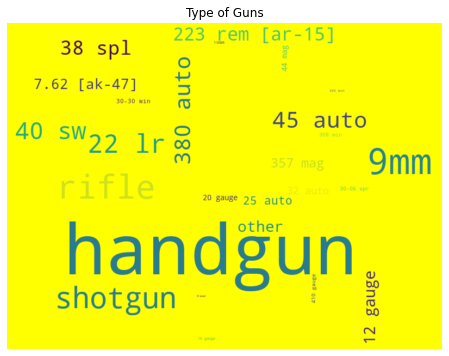

In [ ]:
from wordcloud import WordCloud

# Wordcloud Visual:
gun_t = pd.DataFrame(list_g, columns = ["type"])

gun_t.loc[gun_t["type"]=='unknown', "type" ] = 'handgun'
guns = gun_t["type"].value_counts().to_dict()

wordcloud = WordCloud(height=600, width=800, background_color='yellow')
wordcloud.generate_from_frequencies(frequencies=guns)
plt.figure(figsize=(14,6))
plt.title('Type of Guns')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

###Determine the average age of all participants per incident:

In [ ]:
# Determine the age count per incident:
ages = pd.DataFrame()

age_list = df.participant_age.apply(dissect_str)
ages["age_ct"]= age_list.apply(lambda x: len(x))

# Struggled with ave age - following is a work around:
df["ave_age"] = ages["age_ct"]

for recd in range(len(age_list)):
  sum=0
  for c in range(len(age_list.iloc[recd])):
    if age_list.iloc[recd][c] != 'unknown':
      sum +=  int(age_list.iloc[recd][c])
    
  df["ave_age"].iloc[recd] = sum//ages["age_ct"][recd]

df.drop([ "participant_age"], axis=1, inplace=True )

# Replace ave age of zero with overall average of all participants:
df.loc[ df.ave_age == 0, "ave_age" ] = df[ df.ave_age != 0 ].ave_age.mean()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in long_scalars
  app.launch_new_instance()


###**3. String and Key Word Descriptors:**

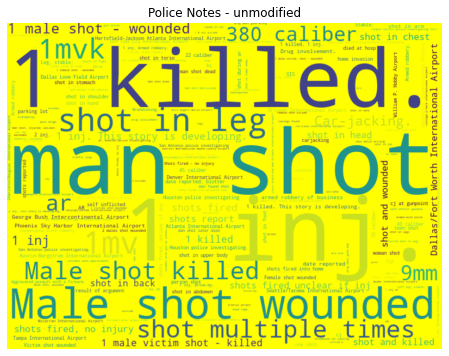

In [ ]:
freq_notes = df['notes'].value_counts().to_dict()

wordcloud = WordCloud(height=600, width=800, background_color='yellow')
wordcloud.generate_from_frequencies(frequencies=freq_notes)
plt.figure(figsize=(14,6))
plt.title('Police Notes - unmodified')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

###The following categories all have important text descriptors(i.e. drugs, felon, domestic violence, suicide, etc...):
1. incident_characteristics
2. location_description
3. participant_relationship
4. notes

###Some of these text key_words will be extracted and used as indicators for a particular incident.

In [ ]:
# Theses 4 columns give incident descriptors:
df.incident_characteristics = df.incident_characteristics.str.lower()
df.location_description = df.location_description.str.lower()
df.participant_relationship = df.participant_relationship.str.lower()
df.notes = df.notes.str.lower()


###Extract relationship key words between suspect(s) and victim(s) if any exist:

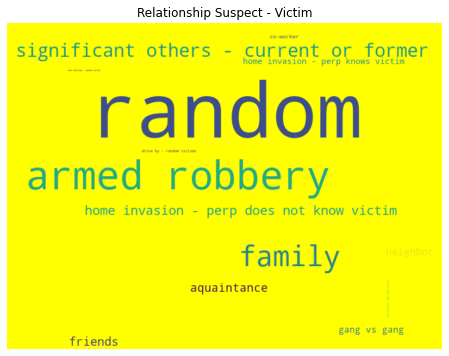

In [ ]:
# Find the unique relationships involved:
relationship = []
for i, each in df.iterrows():
    wrds = each['participant_relationship'].split("||")
    for wrd in wrds:
        wrd = wrd.replace("::",":").replace("|1","")       
        gtype = wrd.split(":")[1]   
        #if gtype not in relationship:        
        relationship.append(gtype)

# Wordcloud Visual:
relationship_t = pd.DataFrame(relationship, columns = ["type"])
relationship_t.loc[relationship_t["type"]=='unknown', "type" ] = 'random'
rel = relationship_t["type"].value_counts().to_dict()

wordcloud = WordCloud(height=600, width=800, background_color='yellow')
wordcloud.generate_from_frequencies(frequencies=rel)
plt.figure(figsize=(14,6))
plt.title('Relationship Suspect - Victim')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

##Location Frequencies:

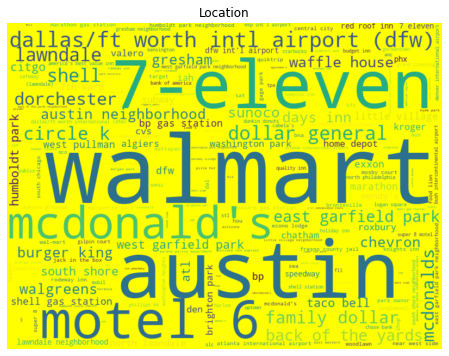

In [ ]:
# Location 
freq_loc = df['location_description'].value_counts().to_dict()

# Wordcloud Visual:
wordcloud = WordCloud(height=600, width=800, background_color='yellow')
wordcloud.generate_from_frequencies(frequencies=freq_loc)
plt.figure(figsize=(14,6))
plt.title('Location')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [ ]:
# Function to dissect row as a string
def dissect(row):
  values = ""
  row_vals = str(row).split("||") 
  for s in row_vals:
    values += s

  return values  # return 1 string 

In [ ]:
# Separate characteristics into 1 string per incident:
df['characteristics'] = df.incident_characteristics.apply(dissect)
df.characteristics

0         shot - wounded/injuredmass shooting (4+ victim...
1         shot - wounded/injuredshot - dead (murder, acc...
2         shot - wounded/injuredshot - dead (murder, acc...
3         shot - dead (murder, accidental, suicide)offic...
4         shot - wounded/injuredshot - dead (murder, acc...
                                ...                        
239672                            shots fired - no injuries
239673    shot - dead (murder, accidental, suicide)insti...
239674                               shot - wounded/injured
239675            shot - dead (murder, accidental, suicide)
239676    shot - dead (murder, accidental, suicide)suici...
Name: characteristics, Length: 239677, dtype: object

In [ ]:
# Search for these key words: 
key_words = ['domestic','significant others','family', 'co-worker','friend','neighbor','acquaintance',
            'alcohol','drug','felon','kidnapping', 'drive-by', 'defensive use', 'car-jacking', 'child',
            'bar', 'gang','school','apartment','club', 'tavern', ')suicide', 'armed robbery', 
            'home invasion', 'random', 'mass', 'shots fired', 'shot' ]

In [ ]:
# Fill in nan fields with empty strings for identifying key_words per incident:
df[["characteristics", "participant_relationship", "notes", "location_description"]] = df[["characteristics", "participant_relationship", "notes", "location_description"]].fillna(value="")

# Concatenate as one string to search for key_words
df["temp"] = df["characteristics"] + df["participant_relationship"] + df["notes"] + df['location_description']

# Create a new specific key word category:
for key in key_words:
  df[key] = df["temp"].apply(lambda x: 1 if key in x else 0)

In [ ]:
# Drop text descriptor columns:
df.drop(["temp", "characteristics", "notes", "location_description", "participant_relationship", "incident_characteristics"], axis=1, inplace=True )
df.rename(columns={")suicide" : "suicide"}, inplace=True)

In [ ]:
df.head(3)

,state,city_or_county,n_killed,n_injured,n_guns_involved,day,month,year,weekday,week,fatality,n_suspects,n_victims,n_Males,n_Females,n_arrests,n_guns_stolen,n_handguns,n_rifles,ave_age,domestic,significant others,family,co-worker,friend,neighbor,acquaintance,alcohol,drug,felon,kidnapping,drive-by,defensive use,car-jacking,child,bar,gang,school,apartment,club,tavern,suicide,armed robbery,home invasion,random,mass,shots fired,shot
0,Pennsylvania,Mckeesport,0,4,1.372442,1,1,2013,1,1,0,1,4,3,1,1,0,1,0,20.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1,California,Hawthorne,1,3,1.372442,1,1,2013,1,1,1,1,4,1,0,0,0,1,0,20.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1
2,Ohio,Lorain,1,3,2.000000,1,1,2013,1,1,1,2,3,5,0,0,0,2,0,31.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,1


In [ ]:
# Condense tavern, bar, and club to 1 category
df_bar = pd.DataFrame()

df_bar["ct"] = df.bar + df.club + df.tavern

df.drop(["bar", "club", "tavern"], axis=1, inplace=True)
df["bar"] = df_bar["ct"]

df["bar"].replace({2:1, 3:1}, inplace=True)
df.head()

,state,city_or_county,n_killed,n_injured,n_guns_involved,day,month,year,weekday,week,fatality,n_suspects,n_victims,n_Males,n_Females,n_arrests,n_guns_stolen,n_handguns,n_rifles,ave_age,domestic,significant others,family,co-worker,friend,neighbor,acquaintance,alcohol,drug,felon,kidnapping,drive-by,defensive use,car-jacking,child,gang,school,apartment,suicide,armed robbery,home invasion,random,mass,shots fired,shot,bar
0,Pennsylvania,Mckeesport,0,4,1.372442,1,1,2013,1,1,0,1,4,3,1,1,0,1,0,20.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
1,California,Hawthorne,1,3,1.372442,1,1,2013,1,1,1,1,4,1,0,0,0,1,0,20.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0
2,Ohio,Lorain,1,3,2.000000,1,1,2013,1,1,1,2,3,5,0,0,0,2,0,31.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
3,Colorado,Aurora,4,0,1.372442,5,1,2013,5,1,1,1,3,3,1,0,0,1,0,37.0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,North Carolina,Greensboro,2,2,2.000000,7,1,2013,0,2,1,1,3,2,2,0,0,2,0,31.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0


##Investigate key_word descriptors to see if we can eliminate some:

In [ ]:
cols = ['domestic', 'significant others', 'shots fired', 'shot',
       'family', 'co-worker', 'friend', 'neighbor', 'acquaintance', 'alcohol',
       'drug', 'felon', 'kidnapping', 'drive-by', 'defensive use',
       'car-jacking', 'child', 'gang', 'school', 'apartment', 'suicide',
       'armed robbery', 'home invasion', 'random', 'mass', 'bar']

wrd_dict = {}
# Find quantities of descriptors:
for col in cols:
  wrd_dict.update({col:len(df[df[col]!=0])})
  print(col, ": ", len(df[df[col]!=0]))

domestic :  11012
significant others :  3467
shots fired :  43712
shot :  183122
family :  4630
co-worker :  159
friend :  3753
neighbor :  4530
acquaintance :  149
alcohol :  3566
drug :  20503
felon :  17605
kidnapping :  2727
drive-by :  13776
defensive use :  7403
car-jacking :  4967
child :  3738
gang :  6014
school :  4630
apartment :  6633
suicide :  5339
armed robbery :  20932
home invasion :  10772
random :  255
mass :  1758
bar :  6865


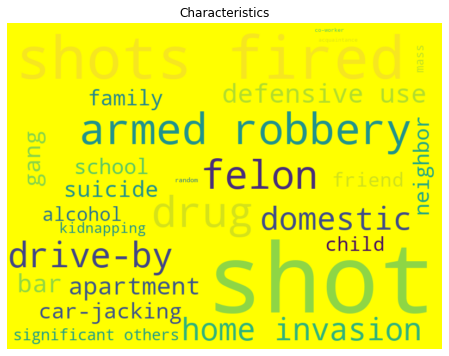

In [ ]:
# Wordcloud Visual of filtered Key_Words:
wordcloud = WordCloud(height=600, width=800, background_color='yellow')
wordcloud.generate_from_frequencies(frequencies=wrd_dict)
plt.figure(figsize=(14,6))
plt.title('Characteristics')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [ ]:
# Drop columns that are not well represented:
df.drop(["co-worker", "acquaintance", "random", "mass", "kidnapping"], axis=1, inplace=True)

In [ ]:
df.shape

(239677, 41)

In [ ]:
df[df.year==2018].head()

,state,city_or_county,n_killed,n_injured,n_guns_involved,day,month,year,weekday,week,fatality,n_suspects,n_victims,n_Males,n_Females,n_arrests,n_guns_stolen,n_handguns,n_rifles,ave_age,domestic,significant others,family,friend,neighbor,alcohol,drug,felon,drive-by,defensive use,car-jacking,child,gang,school,apartment,suicide,armed robbery,home invasion,shots fired,shot,bar
225875,New Jersey,Trenton,0,0,1.0,1,1,2018,0,1,0,1,0,1,0,0,0,1,0,18.000000,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
225876,Massachusetts,Boston,0,0,1.0,1,1,2018,0,1,0,0,0,0,0,0,0,1,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
225877,Massachusetts,Boston,0,0,1.0,1,1,2018,0,1,0,0,0,0,0,0,0,1,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
225878,California,Oakland,1,0,1.0,1,1,2018,0,1,1,1,1,0,1,0,0,1,0,41.000000,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
225879,New York,Buffalo,0,3,1.0,1,1,2018,0,1,0,0,3,2,1,0,0,1,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
base_df18 = df.copy()

###Filter out only data from 2018:

In [ ]:
base_df18 = base_df18[base_df18.year == 2018]
base_df18.drop(["year", "state", "city_or_county"], axis=1, inplace=True)

base_df18.reset_index(drop=True, inplace=True)
print(base_df18.shape)
base_df18.head()

(13802, 38)


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,n_killed,n_injured,n_guns_involved,day,month,weekday,week,fatality,n_suspects,n_victims,n_Males,n_Females,n_arrests,n_guns_stolen,n_handguns,n_rifles,ave_age,domestic,significant others,family,friend,neighbor,alcohol,drug,felon,drive-by,defensive use,car-jacking,child,gang,school,apartment,suicide,armed robbery,home invasion,shots fired,shot,bar
0,0,0,1.0,1,1,0,1,0,1,0,1,0,0,0,1,0,18.000000,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,1.0,1,1,0,1,0,0,0,0,0,0,0,1,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
2,0,0,1.0,1,1,0,1,0,0,0,0,0,0,0,1,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
3,1,0,1.0,1,1,0,1,1,1,1,0,1,0,0,1,0,41.000000,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,0,3,1.0,1,1,0,1,0,0,3,2,1,0,0,1,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


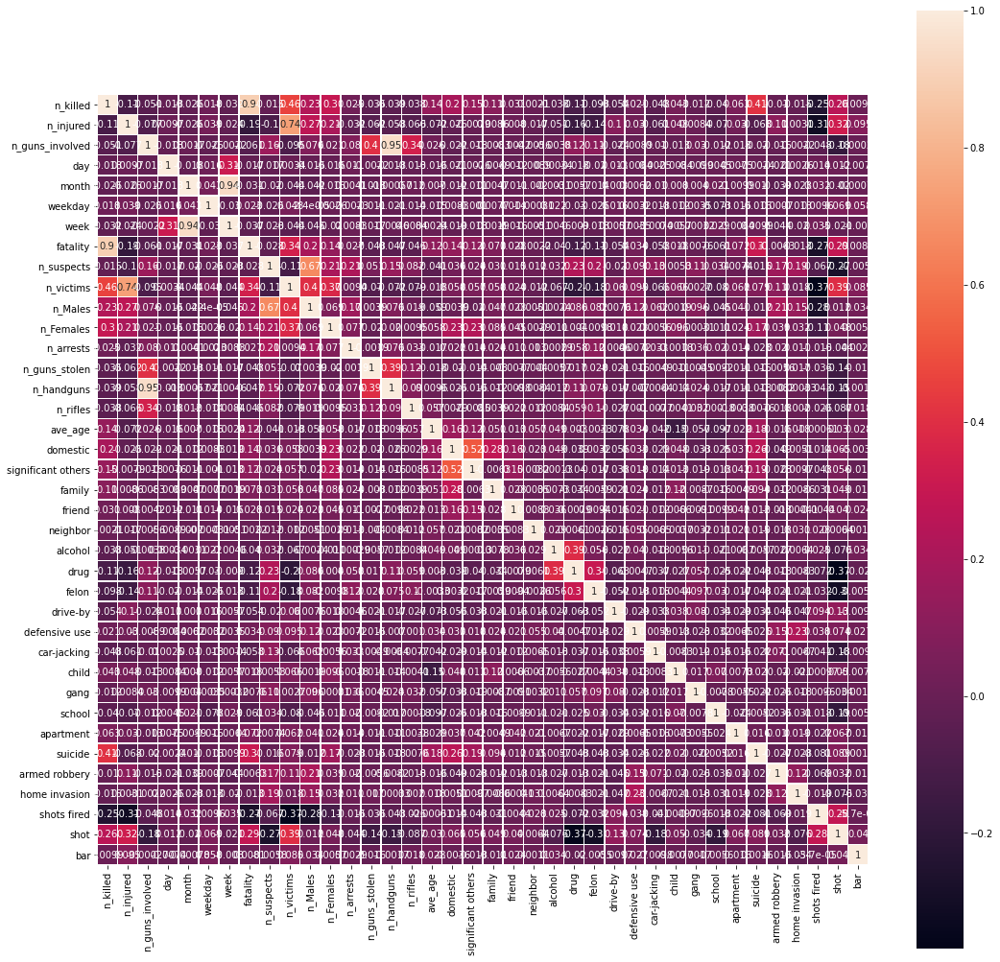

In [ ]:
plt.figure(figsize=(18,18))
sns.heatmap(base_df18.corr(), square=True, annot=True, linewidths=.5)
plt.show()

#**III. Unsupervised Learning Component:**

In [ ]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn import datasets, metrics
import seaborn as sns
from sklearn.cluster import KMeans, MiniBatchKMeans

In [ ]:
# fatality=1, no fatalities=0
y = base_df18["fatality"]
X = base_df18.copy()

X.drop(["fatality"], axis=1, inplace=True)

# Standarizing the features
X_std = StandardScaler().fit_transform(X)

###Run PCA with all 37 features because 36 are categorical.  Get a baseline without any loss of dimensionality first:

In [ ]:
def k_means_score(num):
  return KMeans(n_clusters=num, random_state=123).fit_predict(X_std)

In [ ]:
pca = PCA(37).fit_transform(X_std)

print("K-Means:")
num = 37
print(num, " cluster ARI score:\t\t", metrics.adjusted_rand_score(y, k_means_score(num)))
print(num, " cluster silhouette score:\t", metrics.silhouette_score(pca, k_means_score(num), metric='euclidean'), "\n")

K-Means:
37  cluster ARI score:		 0.043235196560552455
37  cluster silhouette score:	 0.1766680691037533 



###Attempt to find appropriate values of k from Elbow Graph:

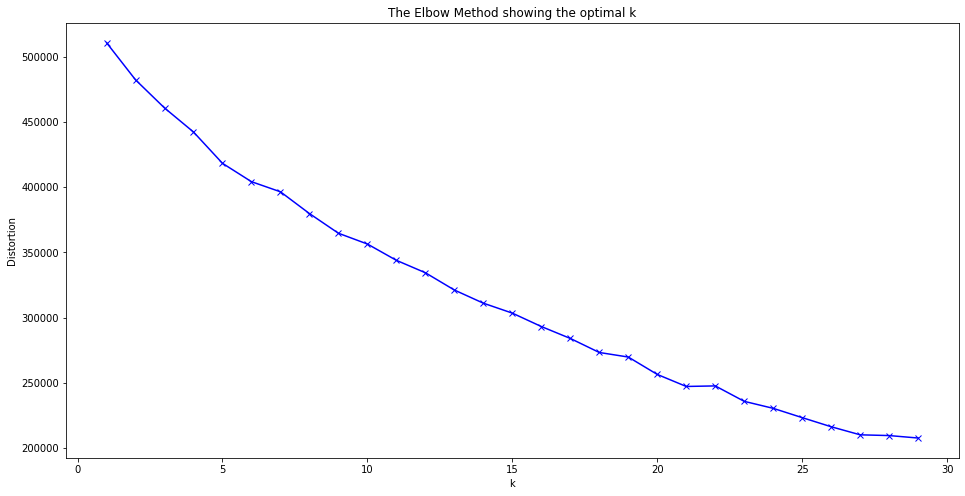

In [ ]:
from scipy.spatial.distance import cdist

# k means determine k
distortions = []
K = range(1,30)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(X_std)
    distortions.append(kmeanModel.inertia_)

# Plot the elbow
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

###The Elbow Graph gives differing solutions each run (displayed run k=23 & 27):

1 loop, best of 5: 1.85 s per loop


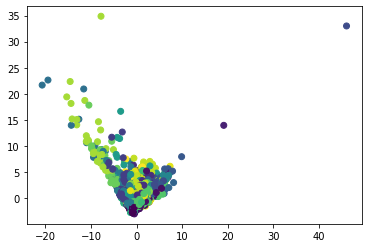

In [ ]:
pca = PCA(2).fit_transform(X_std)

k_means = KMeans(n_clusters=23, random_state=123)
%timeit k_means.fit(X_std)
y_pred = k_means.predict(X_std)

# Plot the solution.
plt.scatter(pca[:,0], pca[:,1], c=y_pred)
plt.show()

10 loops, best of 5: 166 ms per loop


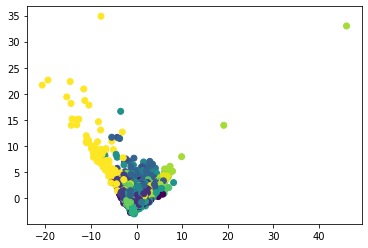

In [ ]:
# Using MiniBatchKMeans
mini_batch_k_means = MiniBatchKMeans(n_clusters=23, random_state=123)
%timeit mini_batch_k_means.fit(X_std)
y_pred_mini = mini_batch_k_means.predict(X_std)

# Plot the solution.
plt.scatter(pca[:,0], pca[:,1], c=y_pred_mini)
plt.show()

##Clustering Techniques:
###I. K-Means

In [ ]:
print("K-Means:")
for num in (23,27):
  print(num, " cluster ARI score:\t\t", metrics.adjusted_rand_score(y, k_means_score(num)))
  print(num, " cluster silhouette score:\t", metrics.silhouette_score(X_std, k_means_score(num), metric='euclidean'), "\n")


K-Means:
23  cluster ARI score:		 0.015935974153702258
23  cluster silhouette score:	 0.17449944209412138 

27  cluster ARI score:		 0.052720980145962944
27  cluster silhouette score:	 0.17606068909997 



###The silhouette no ground-truth scores for both 23 & 27 k-means clustering are comprable to the baseline 37 cluster score fed directly into PCA. 

###II. Hierarchical Clustering - Agglomerative:

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

def agg_score(num):
  return AgglomerativeClustering(linkage='ward', affinity='euclidean',  n_clusters=num).fit_predict(X_std)

In [ ]:
print("AgglomerativeClustering:")
for num in (23,27):
  print(num, " cluster ARI score:\t\t", metrics.adjusted_rand_score(y, agg_score(num)))
  print(num, " cluster silhouette score:\t", metrics.silhouette_score(X_std, agg_score(num), metric='euclidean'), "\n")

AgglomerativeClustering:
23  cluster ARI score:		 0.07325407784911794
23  cluster silhouette score:	 0.1664980999580763 

27  cluster ARI score:		 0.06278673582645157
27  cluster silhouette score:	 0.17889636953875582 



###Both K-Means and the hierarchical agglomerative algorithms appear to favor the 27 clusters for non-ground truth clustering.  

1 loop, best of 5: 8.62 s per loop


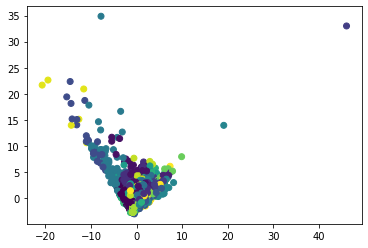

In [ ]:
agg = AgglomerativeClustering(linkage='ward', affinity='euclidean',  n_clusters=23)
%timeit agg.fit(X_std)
y_pred = agg.fit_predict(X_std)

# Plot the solution.
plt.scatter(pca[:,0], pca[:,1], c=y_pred)
plt.show()

###There doesn't appear to be much separation of clusters using the basic PCA dimensionality reduction.

###Dendrogram:

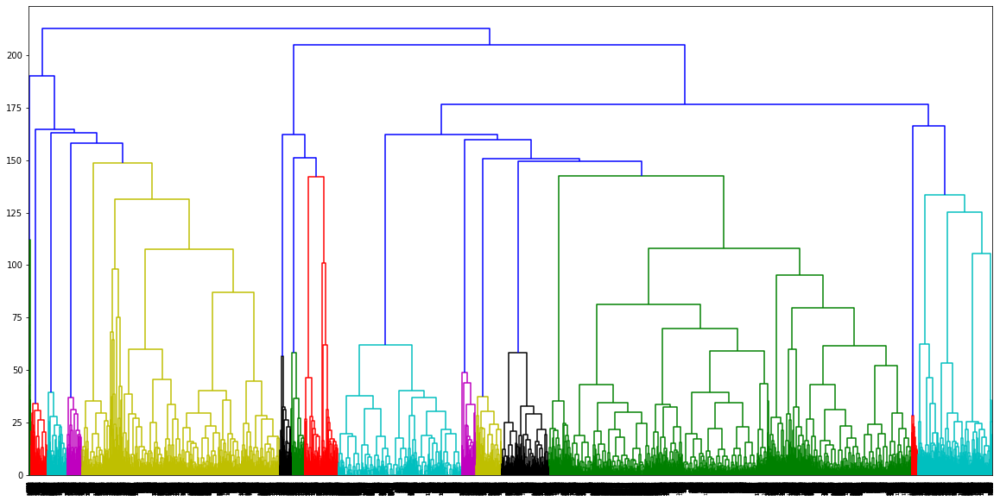

In [ ]:
plt.figure(figsize=(20,10))
dendrogram(linkage(X_std, method='ward'))
plt.show()

###The dendrogram indicates to investigate a 14 cluster approach:

In [ ]:
num = 14

print("K-Means:")
print(num, " cluster ARI score:\t\t", metrics.adjusted_rand_score(y, k_means_score(num)))
print(num, " cluster silhouette score:\t", metrics.silhouette_score(X_std, k_means_score(num), metric='euclidean'), "\n")

print("Agglomerative Clustering:")
print(num, " cluster ARI score:\t\t", metrics.adjusted_rand_score(y, agg_score(num)))
print(num, " cluster silhouette score:\t", metrics.silhouette_score(X_std, agg_score(num), metric='euclidean'), "\n")

K-Means:
14  cluster ARI score:		 0.09951022203649951
14  cluster silhouette score:	 0.12289013300254896 

Agglomerative Clustering:
14  cluster ARI score:		 0.0003867125582658655
14  cluster silhouette score:	 0.07767959355784675 



####The 14 cluster approach is not an improvement what so ever..

###III. DBScan:

In [ ]:
from sklearn.cluster import DBSCAN

# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=.3, min_samples=5)

# Fit model
dbs_clusters = dbscan_cluster.fit_predict(X_std)

print("DBScan Clustering:")
print("ARI score:\t\t", metrics.adjusted_rand_score(y, dbs_clusters))
print("Silhouette score:\t", metrics.silhouette_score(X_std, dbs_clusters, metric='euclidean'))

DBScan Clustering:
ARI score:		 -0.1086449072007911
Silhouette score:	 -0.26980542664181645


In [ ]:
unique = []

for i in range(len(dbs_clusters)):
  if dbs_clusters[i] not in unique:
    unique.append(dbs_clusters[i])

len(unique)

207

In [ ]:
ct=0
for i in range(len(dbs_clusters)):
  if dbs_clusters[i] == -1:
    ct+=1
ct

11797

####The DBScan clustering metrics appear to be quite bad.  DBScan created 206 clusters with 11797 outliers(-1).

###IV. GMM:

In [ ]:
from sklearn.mixture import GaussianMixture

# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=23, random_state=123)

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

print("GMM Clustering:")
print("ARI score:\t\t", metrics.adjusted_rand_score(y, clusters))
print("Silhouette score:\t", metrics.silhouette_score(X_std, clusters, metric='euclidean'))


GMM Clustering:
ARI score:		 0.002275518294823232
Silhouette score:	 0.11910796631589658


###The hierarchical algomeritive 27 cluster non ground-truth score seemed to be the most stable.  So we will investigate that clustering technique when we look closer at relationshiops within the clusters at the conclusion of the report.

##Dimensionality reduction techniques:
###I. t-SNE:

In [ ]:
# t-SNE
from sklearn.manifold import TSNE
import time

# Create and fit t-SNE dimensionality reduction
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 13802 samples in 0.254s...
[t-SNE] Computed neighbors for 13802 samples in 12.977s...
[t-SNE] Computed conditional probabilities for sample 1000 / 13802
[t-SNE] Computed conditional probabilities for sample 2000 / 13802
[t-SNE] Computed conditional probabilities for sample 3000 / 13802
[t-SNE] Computed conditional probabilities for sample 4000 / 13802
[t-SNE] Computed conditional probabilities for sample 5000 / 13802
[t-SNE] Computed conditional probabilities for sample 6000 / 13802
[t-SNE] Computed conditional probabilities for sample 7000 / 13802
[t-SNE] Computed conditional probabilities for sample 8000 / 13802
[t-SNE] Computed conditional probabilities for sample 9000 / 13802
[t-SNE] Computed conditional probabilities for sample 10000 / 13802
[t-SNE] Computed conditional probabilities for sample 11000 / 13802
[t-SNE] Computed conditional probabilities for sample 12000 / 13802
[t-SNE] Computed conditional probabilities for s

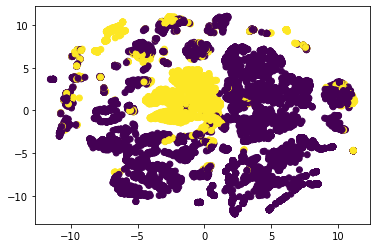

In [ ]:
# Plot the solution.
plt.scatter(tsne_results[:,0], tsne_results[:,1], c=y)
plt.show()

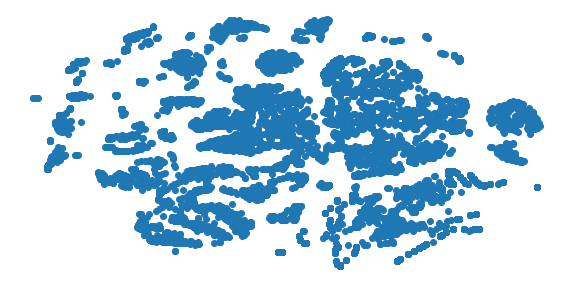

In [ ]:
plt.figure(figsize=(10,5))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
plt.figure(figsize=(10,5))
colours = 'rb'
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

###The t-SNE dimensionality reduction technique does a much better job separating the clusters where the target (fatality - blue) appears to be isolated.

###II. UMAP Reduction:

In [ ]:
!pip install umap-learn
import umap

     |████████████████████████████████| 81kB 2.5MB/s 
     |████████████████████████████████| 1.2MB 5.7MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.1-cp37-none-any.whl size=76569 sha256=db2b3f09a0e2d8c9663736bc8b4e99324a3e373491651ed5479d07e9c9425faf
  Stored in directory: /root/.cache/pip/wheels/ad/df/d5/a3691296ff779f25cd1cf415a3af954b987fb53111e3392cf4
  Created wheel for pynndescent: filename=pynndescent-0.5.2-cp37-none-any.whl size=51351 sha256=21ce131d424a87ad0379dd5bd3848ce978b5804f2910823314c3396041618da8
  Stored in directory: /root/.cache/pip/wheels/ba/52/4e/4c28d04d144a28f89e2575fb63628df6e6d49b56c5ddd0c74e
Successfully built umap-learn pynndescent


In [ ]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

/usr/local/lib/python3.7/dist-packages/umap/spectral.py:256: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "WARNING: spectral initialisation failed! The eigenvector solver\n"
/usr/local/lib/python3.7/dist-packages/umap/spectral.py:256: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "WARNING: spectral initialisation failed! The eigenvector solver\n"
/usr/local/lib/python3.7/dist-packages/umap/spectral.py:256: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "WARNING: sp

UMAP done! Time elapsed: 37.150402545928955 seconds


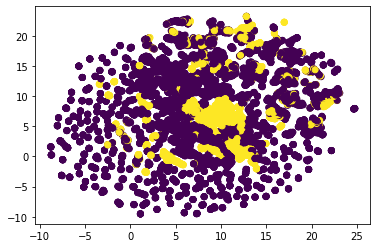

In [ ]:
# Plot the solution.
plt.scatter(umap_results[:,0], umap_results[:,1], c=y)
plt.show()

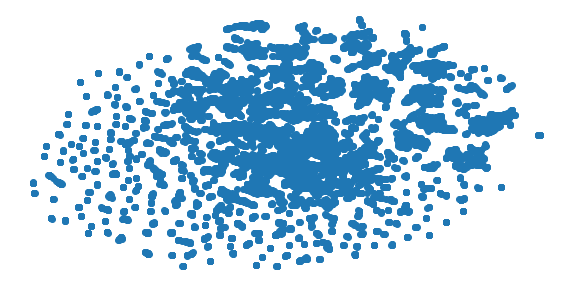

In [ ]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

###The UMAP dimensionality reduction also appears to isolate the target fatalities in a few clusters, but does not due as nice of a job as t_SNE.

##Dimensionality and clustering summarized:
The unsupervised learning algorithms presented here appear to delineate somewhere between 12 and 28 clusters of similar patterns in US gun violence.  T-SNE dimensionality reduction appeared to do the best job of clustering and identifying one particular cluster isolating fatalities.  The remaining portion of this project is devoted to performing a preliminary investigation into the actual clusters and identifying some overlapping relationships within groups of incidents.

##Further investigation using agglomerative clustering of the original 2018 dataset:

In [ ]:
agg_clusters = AgglomerativeClustering(linkage='ward', affinity='euclidean',  n_clusters=23).fit_predict(X_std)

In [ ]:
df18 = df[df.year==2018]

df18["cluster"] = ''
for i in range(len(df18)):
  df18["cluster"].iloc[i] = agg_clusters[i]

df18.reset_index(drop=True, inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pa

In [ ]:
df18.head(3)

,state,city_or_county,n_killed,n_injured,n_guns_involved,day,month,year,weekday,week,fatality,n_suspects,n_victims,n_Males,n_Females,n_arrests,n_guns_stolen,n_handguns,n_rifles,ave_age,domestic,significant others,family,friend,neighbor,alcohol,drug,felon,drive-by,defensive use,car-jacking,child,gang,school,apartment,suicide,armed robbery,home invasion,shots fired,shot,bar,cluster
0,New Jersey,Trenton,0,0,1.0,1,1,2018,0,1,0,1,0,1,0,0,0,1,0,18.000000,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Massachusetts,Boston,0,0,1.0,1,1,2018,0,1,0,0,0,0,0,0,0,1,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,19
2,Massachusetts,Boston,0,0,1.0,1,1,2018,0,1,0,0,0,0,0,0,0,1,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,19


###Examining days of week with fatalities(orange) by cluster:
1. Clusters 5, 9, and 21 have mostly injuries.  Cluster incidents 5 and 9 occured during the middle of the week.
2. Cluster 17 only had fatalities.
3. Cluster 16 occurred primilarily on the weekend.


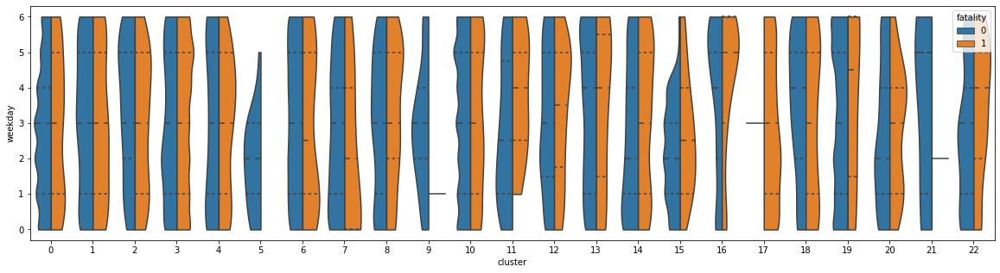

In [ ]:
import seaborn as sns

plt.figure(figsize=(20,5))
ax = sns.violinplot(x="cluster", y="weekday", hue ="fatality", data=df18, cut=0, palatte = "muted", split="true", inner="quartile")

###Clusters 5, 9, & 21 - Minimal Fatalities: High gun count.  Notes indicate some kind of governmental raid.

In [ ]:
df18[df18.cluster==5].head(3)

,state,city_or_county,n_killed,n_injured,n_guns_involved,day,month,year,weekday,week,fatality,n_suspects,n_victims,n_Males,n_Females,n_arrests,n_guns_stolen,n_handguns,n_rifles,ave_age,domestic,significant others,family,friend,neighbor,alcohol,drug,felon,drive-by,defensive use,car-jacking,child,gang,school,apartment,suicide,armed robbery,home invasion,shots fired,shot,bar,cluster
475,District of Columbia,Washington,0,0,36.0,3,1,2018,2,1,0,0,0,0,0,0,0,36,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5
1449,Kentucky,Owensboro,0,0,50.0,10,1,2018,2,2,0,3,0,3,0,0,0,50,0,22.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5
1521,District of Columbia,Washington,0,0,37.0,11,1,2018,3,2,0,0,0,0,0,0,0,37,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5


In [ ]:
df18[df18.cluster==9].head(3)

,state,city_or_county,n_killed,n_injured,n_guns_involved,day,month,year,weekday,week,fatality,n_suspects,n_victims,n_Males,n_Females,n_arrests,n_guns_stolen,n_handguns,n_rifles,ave_age,domestic,significant others,family,friend,neighbor,alcohol,drug,felon,drive-by,defensive use,car-jacking,child,gang,school,apartment,suicide,armed robbery,home invasion,shots fired,shot,bar,cluster
217,Missouri,South West City,0,0,7.0,1,1,2018,0,1,0,1,0,0,0,0,7,7,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9
246,Connecticut,Waterbury,0,1,10.0,2,1,2018,1,1,0,9,1,2,0,0,0,8,1,20.000000,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,1,0,9
278,Texas,Newton (county),0,0,14.0,2,1,2018,1,1,0,3,0,0,0,1,13,5,9,29.911659,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,9


In [ ]:
df18[df18.cluster==21].head(3)

,state,city_or_county,n_killed,n_injured,n_guns_involved,day,month,year,weekday,week,fatality,n_suspects,n_victims,n_Males,n_Females,n_arrests,n_guns_stolen,n_handguns,n_rifles,ave_age,domestic,significant others,family,friend,neighbor,alcohol,drug,felon,drive-by,defensive use,car-jacking,child,gang,school,apartment,suicide,armed robbery,home invasion,shots fired,shot,bar,cluster
450,Florida,Polk City,2,0,31.0,3,1,2018,2,1,1,3,2,5,0,0,31,31,0,37.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,21
873,Ohio,Mason,0,0,22.0,6,1,2018,5,1,0,0,0,0,0,0,22,22,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,21
3412,Texas,Spring,0,0,40.0,22,1,2018,0,4,0,3,0,3,0,0,40,40,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,21


###Cluster 16 - Incidents mostly on weekend:

In [ ]:
df18[df18.cluster==16].head(3)

,state,city_or_county,n_killed,n_injured,n_guns_involved,day,month,year,weekday,week,fatality,n_suspects,n_victims,n_Males,n_Females,n_arrests,n_guns_stolen,n_handguns,n_rifles,ave_age,domestic,significant others,family,friend,neighbor,alcohol,drug,felon,drive-by,defensive use,car-jacking,child,gang,school,apartment,suicide,armed robbery,home invasion,shots fired,shot,bar,cluster
24,Oregon,Prineville,0,1,1.0,1,1,2018,0,1,0,1,1,2,0,0,0,1,0,32.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,16
44,Tennessee,Clarksville,0,1,1.0,1,1,2018,0,1,0,0,1,1,0,0,0,1,0,29.911659,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,16
46,Rhode Island,Providence,0,1,1.0,1,1,2018,0,1,0,1,1,2,0,0,0,1,0,31.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,16


###Cluster 17 - High Fatalities:

In [ ]:
df18[df18.cluster==17].head(3)

,state,city_or_county,n_killed,n_injured,n_guns_involved,day,month,year,weekday,week,fatality,n_suspects,n_victims,n_Males,n_Females,n_arrests,n_guns_stolen,n_handguns,n_rifles,ave_age,domestic,significant others,family,friend,neighbor,alcohol,drug,felon,drive-by,defensive use,car-jacking,child,gang,school,apartment,suicide,armed robbery,home invasion,shots fired,shot,bar,cluster
134,Ohio,Saint Clairsville,2,0,1.0,1,1,2018,0,1,1,1,1,1,1,0,0,1,0,49.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,17
141,Florida,Baker,2,0,1.0,1,1,2018,0,1,1,1,1,1,1,0,0,1,0,64.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,17
216,Mississippi,Jayess,1,0,1.0,1,1,2018,0,1,1,1,0,1,0,0,0,1,0,56.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,17


###Examining average age per incident with fatalities(orange) by cluster:
1. Cluster 22 is the most distrubing cluster because of the young ages.
2. A quick glance at the distributions indicate the median age is approximately 30 years old across all clusters. 

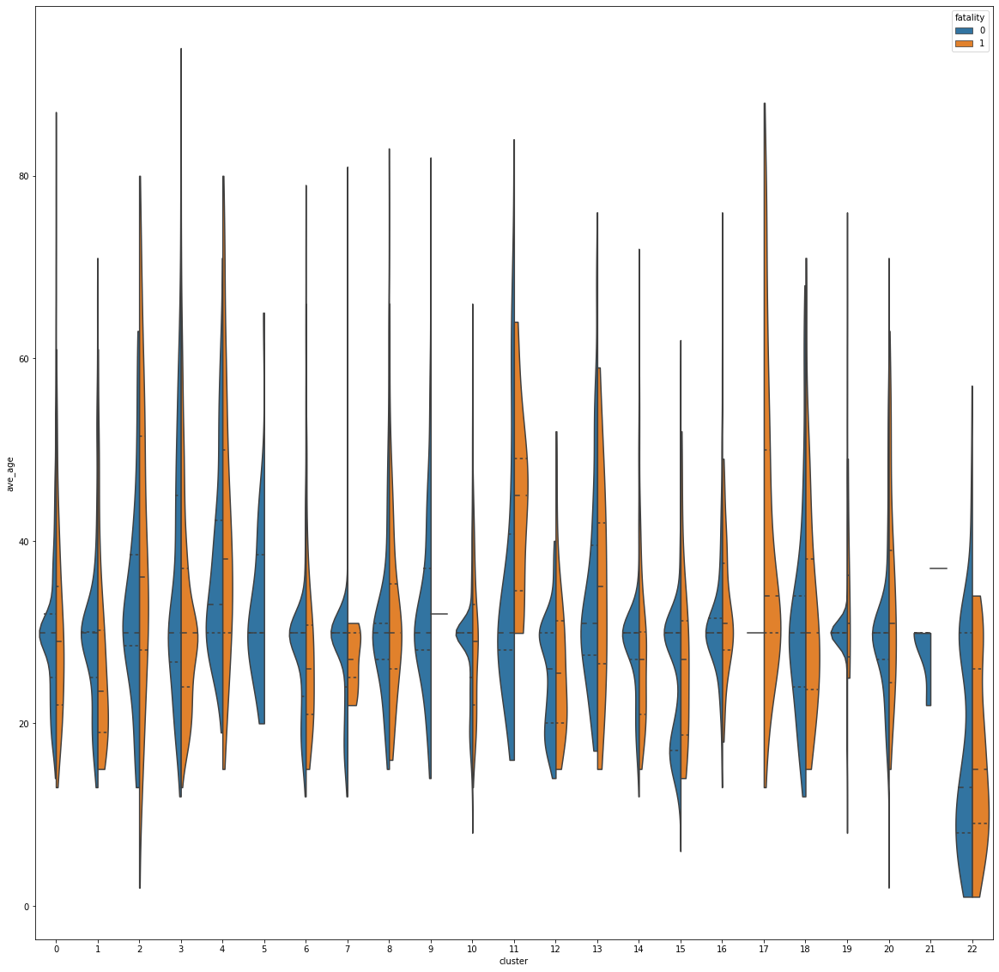

In [ ]:
plt.figure(figsize=(20,20))
ax = sns.violinplot(x="cluster", y="ave_age", hue ="fatality", data=df18, cut=0, palatte = "muted", split="true", inner="quartile")

In [ ]:
df18[df18.cluster==22].head(3)

,state,city_or_county,n_killed,n_injured,n_guns_involved,day,month,year,weekday,week,fatality,n_suspects,n_victims,n_Males,n_Females,n_arrests,n_guns_stolen,n_handguns,n_rifles,ave_age,domestic,significant others,family,friend,neighbor,alcohol,drug,felon,drive-by,defensive use,car-jacking,child,gang,school,apartment,suicide,armed robbery,home invasion,shots fired,shot,bar,cluster
37,California,Los Angeles,0,1,1.0,1,1,2018,0,1,0,0,1,1,0,0,0,1,0,9.000000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,22
42,North Carolina,Charlotte,0,2,1.0,1,1,2018,0,1,0,1,2,2,1,0,0,1,0,29.911659,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,22
167,Alabama,Bessemer (Concord),1,0,1.0,1,1,2018,0,1,1,0,1,1,0,0,0,1,0,7.000000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,22


##A deeper dive into the similarities within each cluster would definitely be warranted and part of a more advanced investigation.  I also believe the true indicators are hidden in the text descriptors.  I tried to extract what I considered to be key word descriptors, but I feel the key to unlocking true insights lies the application of Natural Language Processing (NLP) for this particular situation.  NLP is beyond the scope of this project and would be good choice to pursue for further investigation.   